In [1]:
from __future__ import print_function, division

from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam

import matplotlib.pyplot as plt

import sys

import numpy as np

In [2]:
# 케이스 데이터셋
import glob, os
from tqdm import tqdm
from PIL import Image

image_path = glob.glob("/content/drive/MyDrive/TON2/everycase/data256/*.jpg") # 256x256
# image_paht = glob.glob("/content/drive/MyDrive/TON2/everycase/data128/*.jpg") # 128x128

print(len(image_path)) # 총 12202장의 사진이 존재


## 소예님 방식
# path_dir = '/content/drive/MyDrive/TON2/everycase/data256/'

# file_list = os.listdir(path_dir)
# file_list_py = [file for file in file_list if file.endswith(".jpg")]

# path = []
 
# for i in range(12202):
#     try:
#       path.append(path_dir + file_list[i])
#     except:
#       pass

X_train = []
 
for file in tqdm(image_path, desc='imageloading'):
    # 이미지 열기
    im = np.array(Image.open(file),dtype=np.float32)
    X_train.append((im - 127.5) / 127.5)

X_train = np.asarray(X_train)

12202


imageloading: 100%|██████████| 12202/12202 [02:34<00:00, 78.75it/s] 


In [3]:
print(X_train.shape)

(12202, 256, 256, 3)


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 196608)            0         
                                                                 
 dense_7 (Dense)             (None, 512)               100663808 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 512)               0         
                                                                 
 dense_8 (Dense)             (None, 256)               131328    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 256)               0         
                                                                 
 dense_9 (Dense)             (None, 1)                 257       
                                                                 
Total params: 100,795,393
Trainable params: 100,795,39

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:134: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
25000 [D loss: 0.478603, acc.: 75.78%] [G loss: 2.106656]
25001 [D loss: 0.334227, acc.: 84.77%] [G loss: 2.164576]
25002 [D loss: 0.332187, acc.: 85.55%] [G loss: 2.330558]
25003 [D loss: 0.398676, acc.: 80.08%] [G loss: 1.977775]
25004 [D loss: 0.562896, acc.: 68.36%] [G loss: 2.087372]
25005 [D loss: 0.440848, acc.: 78.91%] [G loss: 1.988027]
25006 [D loss: 0.484700, acc.: 76.56%] [G loss: 1.899669]
25007 [D loss: 0.397882, acc.: 82.03%] [G loss: 2.484438]
25008 [D loss: 0.469651, acc.: 77.73%] [G loss: 2.252235]
25009 [D loss: 0.454018, acc.: 78.12%] [G loss: 2.205365]
25010 [D loss: 0.369362, acc.: 82.42%] [G loss: 2.237991]
25011 [D loss: 0.441504, acc.: 78.91%] [G loss: 2.468063]
25012 [D loss: 0.381854, acc.: 83.20%] [G loss: 2.364195]
25013 [D loss: 0.450939, acc.: 80.47%] [G loss: 2.126523]
25014 [D loss: 0.387462, acc.: 82.03%] [G loss: 2.102509]
25015 [D loss: 0.426830, acc.: 82.03%] [G loss: 2.142423]
25016 [D loss: 0.434712, acc.: 77.34

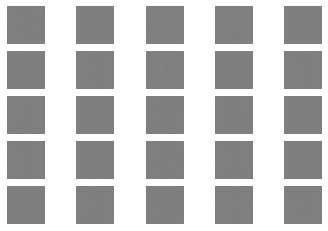

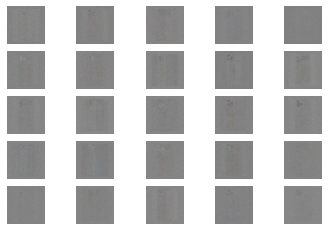

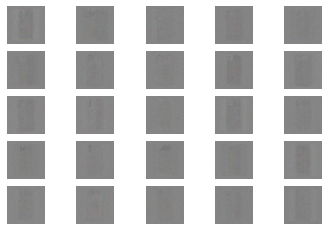

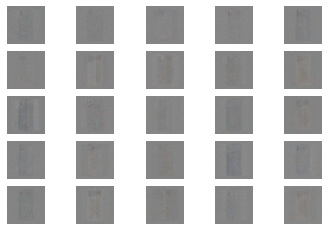

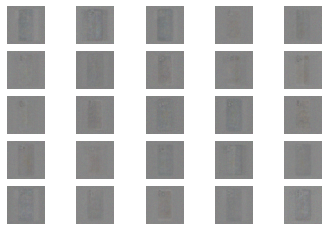

...

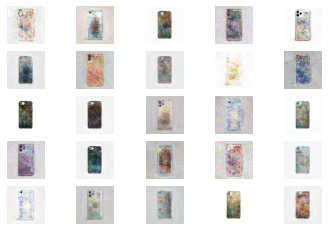

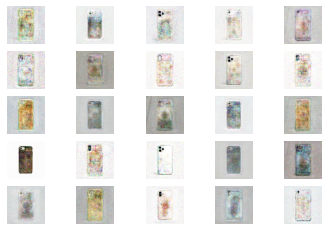

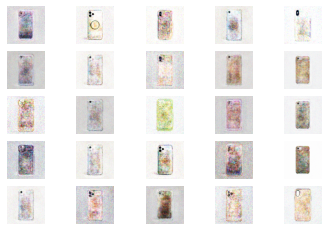

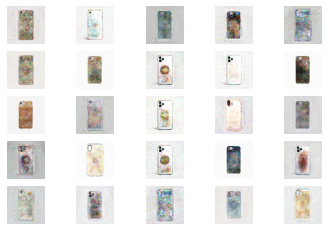

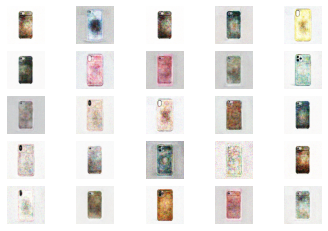

In [5]:
class GAN():
    def __init__(self):
        self.img_rows = 256
        self.img_cols = 256
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100     # latent_dim = 입력층의 뉴런 수

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])     # accuracy가 맞나??

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):  # generator 빌드

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):   # discriminator 빌드

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset # mnist 데이터셋 다운
        # X_train = image_path
        # X_train = np.array(X_train, dtype=np.float32)

        # Rescale -1 to 1 # 데이터 전처리 -1 ~ 1 사이의 값으로 (픽셀)
        # X_train = X_train / 127.5 - 1
        global X_train
        # X_train = np.expand_dims(X_train, axis=3) # 여기서 차원이 늘어남

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))
        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]
            
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,:])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("/content/drive/MyDrive/TON2/GAN_save/%d.jpg" % epoch)
    #     plt.close()


if __name__ == '__main__':
    gan = GAN()
    gan.train(epochs=30000, batch_size=128, sample_interval=200)